# Домашнее задание по теме «Оптимизация и табличные данные»

Сегодня ты продолжишь работать с оптимизаторами.

В этом домашнем задании тебе нужно:
- реализовать градиентный спуск для линейной регрессии с двумя параметрами для оптимизации: смещением и наклоном;
- разобраться, что такое шедулер, и реализовать его для алгоритма градиентного спуска;
- заняться оптимизацией более сложной функции, чем на семинаре.

## Подготовка

In [157]:
# Импортируй библиотеки
import numpy as np
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots # Нарисуем subplots для красивой визуализации
import plotly.graph_objects as go # Используем Plotly для динамических фигур

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

Ты опять будешь работать с синтетическими данными, как на семинаре. Запусти ячейку ниже, чтобы сгенерировать их.

Ничего не меняй в этой ячейке. Так ассистенту будет удобнее проверять задачи.

In [158]:
# Отличие от семинара в том, что мы задаём смещение (mu), равное 3, а не нулю
np.random.seed(123) # Генерация будет случайной, так что зафикисруем seed на всякий случай
N = 200 # Сколько точек хотим сгенерировать
X = np.random.rand(N) # Генерируем точки по оси X
# Задаём параметр наклона нашей прямой. Именно его будет подбирать наша линейная модель. У нас всего одна переменная X, если переменных будет больше, то W будет в виде вектора
W = 10
# Среднее и стандартное отклонение для коэффициента смещения наших данных
mu, sigma = 3, 0.5 # mean and standard deviation. Среднее задаём 3
b = np.random.normal(mu, sigma, N)
# Определяем нашу сгенерированную зависимость. Если в данных больше одной переменной, то между W и X произведение будет матричное
y = W*X + b

Вот так будут выглядеть наши данные на графике.

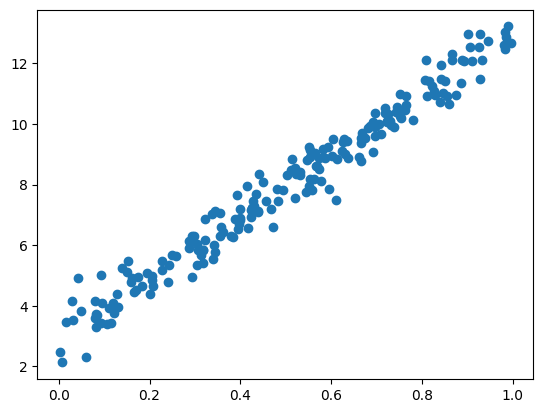

In [159]:
plt.scatter(X, y)
plt.show()

## Задача 1. Добавление параметра сдвига к линейной регрессии [4 балла]

На семинаре была рассмотрена линейная регрессия для случая, когда есть всего один обучаемый параметр наклона. Сейчас требуется усложнить модель и добавить в неё параметр сдвига.

Тебе нужно:
1. Написать формулу вычисления градиента для параметра сдвига и наклона.
> **Примечание.** Это можно сделать в формате LaTeX. Все необходимые части кода уже были в семинаре. Если трудно использовать LaTeX, напиши своё решение на бумаге и прикрепи его к ноутбуку. **[1 балл]**
2. Реализовать функцию для вычисления градиента для параметров сдвига и наклона для MSE. **[1 балл]**
3. Реализовать градиентный спуск для двух параметров сразу. **[1,5 балла]**
4. Сделать пошаговую визуализацию процесса оптимизации. **[0,5 балла]**

Чтобы решить задачу, заполни пропуски в формулах и коде ниже.

### Твой ответ на задачу 1

1. Формула вычисления градиента для параметра сдвига.

   Формула линейной регрессии для двух параметров имеет вид
$$y = b + wx_i.$$

   Тогда производные для MSE по её параметрам будут равны:

$$\frac{\partial MSE}{\partial w} = -\frac{2x(y-(wx+b))}{n}$$

$$\frac{\partial MSE}{\partial b} = -\frac{2(y-(wx+b))}{n}$$



In [160]:
# 2. Реализуй функции вычисления градиента для параметров сдвига и наклона
def grad_mse_W(X: np.array, W: np.array, b: np.array, y: np.array):
  return -2 * np.mean(X * (y-(W*X+b)))

def grad_mse_b(X: np.array, W: np.array, b: np.array, y: np.array):
  return -2 * np.mean(y-(W*X+b))

In [161]:
# 3. Градиентный спуск для линейной регрессии
n_epochs = 1000 # Пусть хотим сделать 1000 шагов оптимизации
tol = 1e-6 # Сходимость определим как изменение функции потерь после шага менее чем на 1e-6
lr_W = 0.1
lr_b = 0.1
model = LinearRegression() # Инициализируем модель

# Переменная для хранения прошлого значения функции потерь
prev_loss = np.inf

# Стартовое значение параметров модели
W = np.array([0.0])
b = np.array([0.0])
model.coef_ = W.reshape((1, 1))
model.intercept_ = b

# Здесь будем хранить историю функции потерь
loss_hist = []
W_hist = []
b_hist = []

for e in range(n_epochs): # Задаём количество эпох

  y_pred = model.predict(X.reshape((-1, 1))) # Делаем предсказание моделью
  loss = mean_squared_error(y, y_pred) # Считаем функцию потерь
  loss_hist.append(loss) # Сохраняем в историю
  W_hist.append(W.item())
  b_hist.append(b.item())

  # Если изменение функции потерь меньше tol, то останавливаемся
  if np.abs(prev_loss - loss) < tol:
    break

  # Обновляем прошлое значение функции потерь
  prev_loss = loss
  # Сдвигаем параметры против градиента
  w_grad = grad_mse_W(X, W, b, y)
  b_grad = grad_mse_b(X, W, b, y)
  
  W = W - lr_W * w_grad
  b = b - lr_b * b_grad

  # Обновляем параметры модели
  model.coef_ = W.reshape((1, 1))
  model.intercept_ = b


In [162]:
# Результат обучения должен приблизится к значениям наклона и сдвига для генерации данных. Если отклонение в пределах 0,1, то всё в порядке
W, b

(array([9.96247189]), array([2.95878751]))

In [163]:
# 4. Визуализация работы градиентного спуска
# Данная функция практически такая же, как на семинаре. Из неё убрали расчёт значения по оси Z, теперь он передаётся как аргумент
# Здесь тебе ничего писать не надо
def plot_surface(X, Y, Z, surface_foo, surface_optim, surface_init, traj_data=None):

  fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z)])

  # Рисуем точку оптимума
  fig.add_trace(go.Scatter3d(
      x=[surface_optim[0]],
      y=[surface_optim[1]],
      z=[surface_foo(surface_optim[0], surface_optim[1])],
      marker=dict(symbol='x'),
      name='Optimum',
      showlegend=False
  ))

  # Рисуем точку старта
  fig.add_trace(go.Scatter3d(
      x=[surface_init[0]],
      y=[surface_init[1]],
      z=[surface_foo(surface_init[0], surface_init[1])],
      marker=dict(symbol='circle'),
      name='Init',
      showlegend=False
  ))

  # Пригодится для отрисовки работы оптимизатора
  if isinstance(traj_data, np.ndarray):
    add_traj(fig, surface_foo, traj_data, 'GD', color='gold')

  # Рисуем сетку
  # По горизонтали
  for i, j, k in zip(X[::25], Y[::25], Z[::25]):
      fig.add_trace(go.Scatter3d(x=i, y=j, z=k, mode='lines', marker=dict(color='black'), showlegend=False))

  # По вертикали
  for i, j, k in zip(X[::25], Y[::25], Z.T[::25]):
      fig.add_trace(go.Scatter3d(x=j, y=i, z=k, mode='lines', marker=dict(color='black'), showlegend=False))

  # Настройка отображения графика
  fig.update_layout(title=dict(text='SGD для линейной регрессии'), autosize=True)

  # Выводим график
  fig.show()

# Функция для отрисовки траектории тоже, как на семинаре
def add_traj(fig: go.Figure, surface_foo, traj: np.array, traj_name: str, color: str='gold'):
    fig.add_trace(go.Scatter3d(
        x=traj[0],
        y=traj[1],
        z=surface_foo(traj[0], traj[1]).ravel(),
        name=traj_name,
        mode='markers+lines',
        marker=dict(symbol='circle-open', color=color)
    ))

In [164]:
# Функция для вычисления значения Z. Проверка на isinstance нужна, чтобы сразу для разных размерностей корректно работало: когда передаём один элемент или целый массив
# В ней тоже всё уже написано, можешь просто посмотреть, что в ней происходит
def ndim_mse_val(w, b):
  # if нужен, чтобы получить параметры для дальнейшего корректного broadcasting
  if isinstance(w, float):
    sh = 1
  else:
    sh = tuple(range(1, len(w.shape)+1))
  # Просто MSE, который адаптивно считается как для скаляра, так и для вектора
  mse = ((((w * np.expand_dims(X, axis=sh)) + b) - np.expand_dims(y, axis=sh))**2).mean(axis=0).astype(float)
  if isinstance(w, float):
    return mse.item()
  return mse

limits = (-1.0, 15.0) # Ограничения функции для визуализации. Мы не будем рисовать всю поверхность, потому что это 3D-парабола и будет плохо видно
optim = (10.0, 3.0) # Точка оптимума
init = (0.0, 0.0) # Точка старта нашего оптимизатора

In [165]:
# Задаём сетку, по которой будем рисовать функцию
x = np.linspace(limits[0], limits[1], 250)
W_, b_ = np.meshgrid(x, x)

MSE = ndim_mse_val(W_, b_)

# Рисуем
plot_surface(W_, b_, MSE, ndim_mse_val, optim, init, traj_data='Подай траекторию в формате x и y — отдельные столбцы')

## Задача 2. Шедулер и оптимизация сложной функции [5 баллов]

Мы уже пробовали разный темп обучения (англ. learning rate). Если он был очень большой, то оптимизатор быстро начинал сходиться в сторону минимума, но потом где-то застревал, не доходя до него. Если мы брали маленький learning rate, то алгоритм сходился медленно с самого старта. В этом случае мы не ждали, чтобы не тратить время на семинаре. Ждать пришлось бы долго, но результат был бы не хуже, чем для варианта с большим learning rate.

Отсюда следует идея шедулера. Почему бы нам не сделать большой learning rate вначале, а потом постепенно уменьшать его по мере обучения.

> **Шедулер** (от англ. scheduler) — это несложная функция, которая по некоторому расписанию меняет learning rate для нашего алгоритма оптимизации. Иногда шедулер назвают «планировщик».

В этой задаче тебе нужно оптимизировать одну сложную функцию с множеством локальных минимумов и одним глобальным. Обходить минимумы ты будешь с помошью косинусного шедулера. То есть скорость обучения будет то падать, то расти. Почему так?

Вспомним семинар: при большом learning rate значение нашей функции потерь росло. То есть в данной задаче при попадании в локальный минимум у оптимизатора будет шанс выбраться из него и исследовать другие минимумы.

Тебе нужно:
1. Визуализировать функцию, реализовать её вычисление и подсчитать градиенты. **[1 балл]**
2. Запустить из случайной точки градиентый спуск и описать, куда он сойдётся. **[0,5 балла]**
3. Реализовать косинусный шедулер. **[1 балл]**
4. Визуализировать, как работает шедулер — подать в него последовательно аргументы и сделать список из lr, который затем надо нарисовать на графике. **[0,5 балла]**
4. Запустить оптимизатор с косинусным шедулером. В результате оптимизатор должен обойти хотя бы несколько локальных минимумов (здорово, если он свалится в глобальный по итогу, но это необязательно). **[1,5 балла]**
5. Нарисовать маршрут оптимизатора с шедулером и написать свои выводы. **[0,5 балла]**

### Твой ответ на задачу 2

1. Функция, с которой ты сегодня будешь работать, называется Styblinski-Tang. Для $n$-мерного случая она записывается в виде

$$f(x) = \frac{1}{2}\sum_{i=1}^{n}(x_i^4 - 16x_i^2 + 5x_i).$$

Реализуй вычисление данной функции и её градиентов для двумерного случая.

In [166]:
def styblinski(x, y):
  return 0.5*(x**4-16*x**2+5*x+y**4-16*y**2+5*y)

def styblinski_grad(x, y): # 1-е значение массива — градиент для x, 2-е значение массива — градиент для y
  return np.array([2*x**3-16*x+2.5, 2*y**3-16*y+2.5])

Задай точки для графика и параметры для отображения.

In [167]:
limits = (-5, 5) # Ограничения функции для визуализации. Мы не хотим рисовать всю поверхность
optim = (-2.903534, -2.903534) # Точка оптимума
init = (1.5, 1.7) # Точка старта нашего оптимизатора. Не меняй, чтобы дальнейшая траектория спуска красиво визуализировалась
z_optim = styblinski(optim[0], optim[1]) # Посчитаем значение оптимума, это потом пригодится

#  Задаём сетку, по которой будем рисовать функцию
x = np.linspace(limits[0], limits[1], 250)
X, Y = np.meshgrid(x, x)
Z = styblinski(X, Y)

# Рисуем
plot_surface(X, Y, Z, styblinski, optim, init)

In [168]:
# 2. Запусти градиентный спуск
# Функция такая же, как на семинаре
def gradientDescent_eps(fun, grad_fun, init, lr=1e-3, eps=1e-6, max_steps=1000):
    traj = [np.array(init)] # Сохраняем точку старта в нашу траекторию
    count = 1 # И начинаем считать
    x = traj[-1].copy() # Кладём x в отдельную переменную, чтобы она не изменялась внутри списка
    while eps < np.abs(fun(x[0], x[1]) - z_optim): # Итерируемся, пока не приблизимся к оптимуму
        x -= lr * grad_fun(x[0], x[1]) # Шаг градиентного спуска
        traj.append(x.copy()) # Кладём траекторию в историю
        count += 1
        if count == max_steps: # Если количество шагов превышено, заканчиваем
          break
    return np.array(traj).T, count

gradientDescent_traj, steps = gradientDescent_eps(styblinski, styblinski_grad, init)
steps

1000

In [169]:
# Нарисуй траекторию
plot_surface(X, Y, Z, styblinski, optim, init, gradientDescent_traj)

Что думаешь о полученных результатах?

что он не сходится с глобальным минимумом

3. Теперь нужно реализовать косинусный шедулер.
Его формула:
$$lr_t = lr_{min} + \frac{1}{2}(lr_{max} - lr_{min}) (1 + cos(\frac{step_t}{max_steps})).$$

In [170]:
# 3. Косинусный шедулер
def cos_sched(step, max_steps, min_lr, max_lr):
  return min_lr+0.5*(max_lr - min_lr) * (1 + np.cos(step/max_steps))

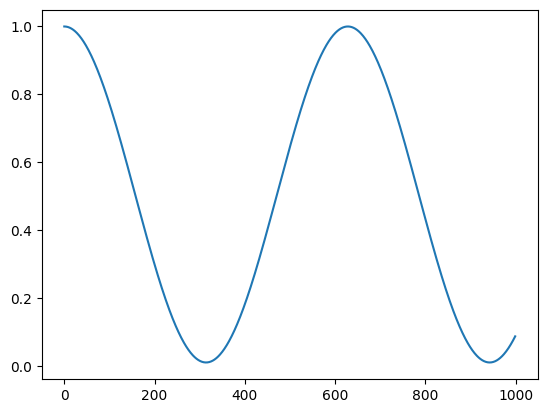

In [171]:
# 4. Нарисуй, как у тебя будет изменяться lr в зависимости от номера шага. Должна получиться синусоида
res = [cos_sched(step, 100, 1e-2, 1) for step in range(1000)]
plt.plot(res)
plt.show()

In [172]:
# 5. Запусти оптимизатор с косинусным шедулером и получи траекторию
def CosineGradientDescent_eps(fun, grad_fun, init, min_lr=1e-3, max_lr=5.5e-2, eps=1e-6, sched_steps=1000, max_steps=10000):
  '''Из нового:
        min_lr — минимальный lr, который будет возвращать косинусный шедулер
        max_lr — максимальный lr, который будет возвращать косинусный шедулер
        sched_steps — сколько шагов от min_lr до max_lr или наоборот, то есть мы сделаем max_steps/sched_steps циклов роста и снижения lr'''
  traj = [np.array(init)] # Сохраняем точку старта в нашу траекторию
  count = 1 # И начинаем считать
  x = traj[-1].copy() # Кладём x в отдельную переменную, чтобы она не изменялась внутри списка
  while eps < np.abs(fun(x[0], x[1]) - z_optim): # Итерируемся, пока не приблизимся к оптимуму
      lr = cos_sched(count, sched_steps, min_lr, max_lr)
      x -= lr * grad_fun(x[0], x[1]) # Шаг градиентного спуска
      traj.append(x.copy()) # Кладём траекторию в историю
      count += 1
      if count == max_steps: # Если количество шагов превышено, заканчиваем
        break
  return np.array(traj).T, count

CosinegradientDescent_traj, steps = CosineGradientDescent_eps(styblinski, styblinski_grad, init)
steps

10000

In [173]:
# 6. Нарисуй, что получилось
plot_surface(X, Y, Z, styblinski, optim, init, CosinegradientDescent_traj)

Опиши, что получилось.

Также не удалось выбраться из ямы)))

## Задача 3. Перезапуск оптимизатора [1 балл + 2 бонусных балла]

Ещё один способ поиска глобального минимума среди локальных — это перезапуск оптимизатора с разных точек функции потерь.

Изначально мы могли перебирать точку init по сетке, а потом просто выбрать лучшую траекторию, но в реальной ситуации это было бы долго, ведь пространство для перебора точек по сетке крайне велико.

Чтобы как-то сократить пространство для перебора, мы один раз применили шедулер, который помог нам исследовать пространство нашей функции.

Тебе нужно:
1. Извлечь 20 точек с минимальным значением функции потерь. **[1 балл]**
2. Из каждой точки запустить обычный градиентный спуск без шедулера (это нужно, чтобы не вылететь из оптимума). **[1 балл]**
3. Нарисовать одну лучшую траекторию. **[1 балл]**

## Твой ответ на задачу 3

In [174]:
# 1. Извлеки топ-20 точек по MSE
Z_cos = styblinski(CosinegradientDescent_traj[0], CosinegradientDescent_traj[1]) # Сначала получи значения нашей функции
idx = np.argpartition(Z_cos, 20)[:20]
top_20 = CosinegradientDescent_traj[:, idx]

In [175]:
# 2. Запусти из каждой точки градиентный спуск и сохрани лучшую траекторию
best_res = np.inf
for pair in top_20.T:
  gradientDescent_traj, _ = gradientDescent_eps(styblinski, styblinski_grad, pair)
  final_point = gradientDescent_traj[:, -1] 
  Z_val = styblinski(pair[0], pair[1])
  if best_res > Z_val:
    best_res = Z_val
    best_traj = gradientDescent_traj

In [176]:
# 3. Нарисуй лучшую траекторию
plot_surface(X, Y, Z, styblinski, optim, [best_traj[0][0], best_traj[1][0]], best_traj)

Опиши, что получилось.

Не удалось избежать ямы, даже с schedul'eром не удалось дать мощный импульс и выбраться из ямы.